In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


(10000, 28, 28, 1)
[[0.331 0.237 0.142 ... 0.318 0.457 0.851]
 [0.208 0.053 0.982 ... 0.594 0.903 0.033]
 [0.115 0.764 0.811 ... 0.307 0.015 0.319]
 ...
 [0.425 0.596 0.927 ... 0.716 0.66  0.228]
 [0.725 0.623 0.555 ... 0.726 0.348 0.437]
 [0.912 0.485 0.483 ... 0.78  0.685 0.039]]


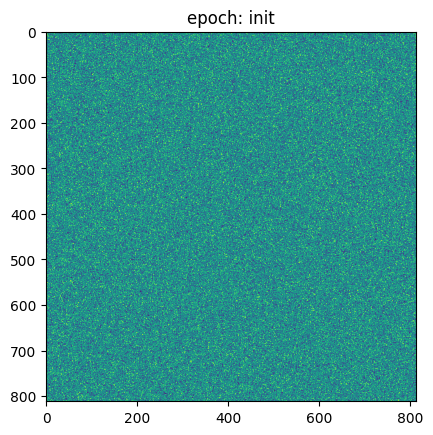

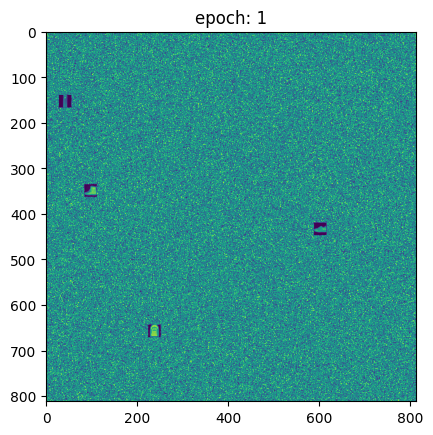

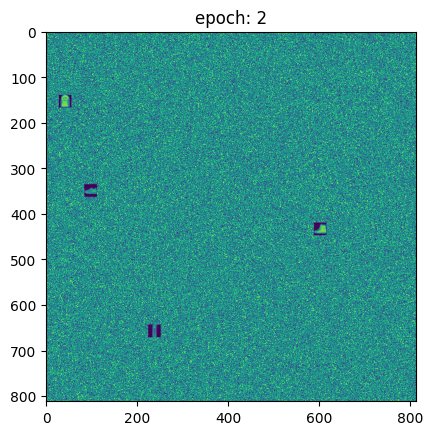

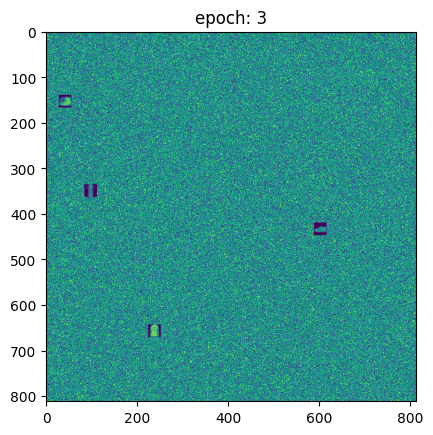

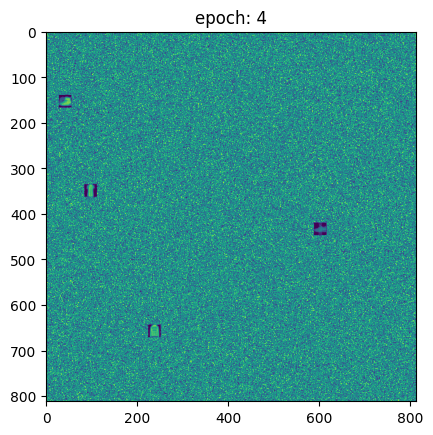

...

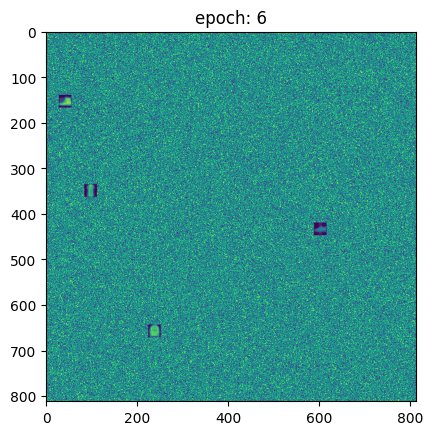

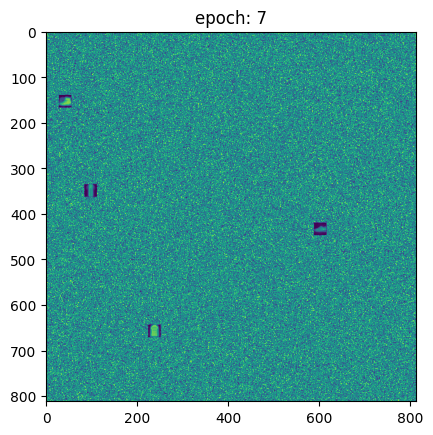

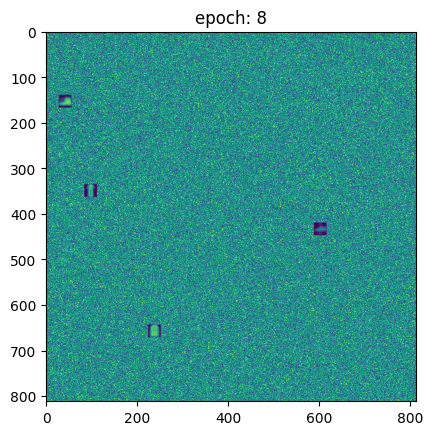

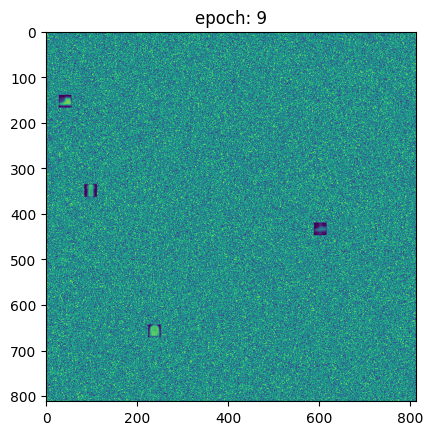

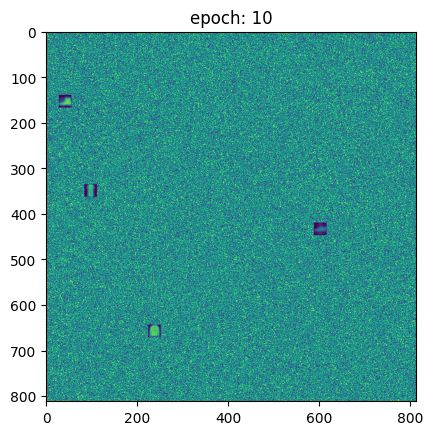

[[0.3 0.2 0.1 ... 0.3 0.5 0.9]
 [0.2 0.1 1.  ... 0.6 0.9 0. ]
 [0.1 0.8 0.8 ... 0.3 0.  0.3]
 ...
 [0.4 0.6 0.9 ... 0.7 0.7 0.2]
 [0.7 0.6 0.6 ... 0.7 0.3 0.4]
 [0.9 0.5 0.5 ... 0.8 0.7 0. ]]
(841, 784)
Table for class discrimination by neurons
Cluster: 675, classes: [ 84.  93. 111.  92.  94.  45.  93.   8.  91.  50.]
Cluster: 146, classes: [ 0.  0.  0.  0.  0. 44.  0. 97.  1. 64.]
Cluster: 351, classes: [0. 6. 0. 2. 0. 0. 0. 0. 0. 0.]
Cluster: 801, classes: [0. 0. 0. 0. 0. 3. 0. 0. 0. 0.]
Cluster: 377, classes: [0. 0. 0. 0. 0. 1. 0. 0. 1. 0.]
Cluster: 727, classes: [0. 0. 0. 0. 0. 2. 0. 0. 0. 0.]
Cluster: 494, classes: [0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
Cluster: 814, classes: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
Cluster: 11, classes: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
Cluster: 171, classes: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]

Table for number of class discrimination by neurons
Cluster: 675, classes: 761
Cluster: 146, classes: 206
Cluster: 351, classes: 8
Cluster: 801, classes: 3
Cluster: 377, class

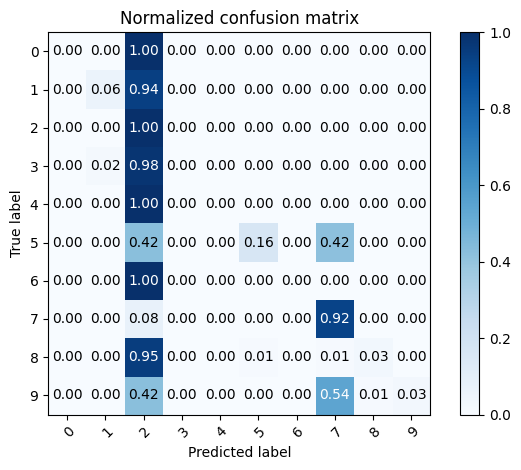

In [3]:
import numpy as np
import pandas as pd


def top_neurons(labels_predicted1, top):
    labels_predicted1 = np.array(labels_predicted1, dtype=int)
    neuron_dict1 = {}
    for i in range(len(labels_predicted1)):
        if labels_predicted1[i] in neuron_dict1.keys():
            neuron_dict1[labels_predicted1[i]] += 1
        else:
            neuron_dict1[labels_predicted1[i]] = 1
    neuron_list1 = sorted(neuron_dict1, key=neuron_dict1.get, reverse=True)[:top]
    return neuron_list1, neuron_dict1


''' Load data '''
import gzip
import matplotlib.pyplot as plt
import numpy as np

f = gzip.open('/content/gdrive/MyDrive/t10k-images-idx3-ubyte.gz', 'r')

image_size = 28
num_images = 10000

f.read(16)
buf = f.read(image_size * image_size * num_images)
data = np.frombuffer(buf, dtype=np.uint8).astype(np.float32)
data = data.reshape(num_images, image_size, image_size, 1)
print(data.shape)

data = data.reshape(num_images, 784)
data = data / 255.0
image = np.asarray(data[3].reshape(28, 28)).squeeze()

# plt.imshow(image)

data = data.reshape(num_images, 784)
vectors = data

''' Load labels '''
f = gzip.open('/content/gdrive/MyDrive/t10k-labels-idx1-ubyte.gz', 'r')
f.read(8)
labels_true = []
for i in range(0, num_images):
    buf = f.read(1)
    labels = np.frombuffer(buf, dtype=np.uint8).astype(np.int64)[0]
    labels_true.append(labels)
    # print(labels)
labels_true = np.array(labels_true)
# print(labels_true[2])

''' Shuffle data '''
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(data, labels_true, test_size=0.1, random_state=42)

data = X_test
vectors = data
labels_true = y_test

''' Initialize parameters'''
# vectors = np.array([[1, 1, 0, 0],
#                     [0, 0, 0, 1],
#                     [1, 0, 0, 0],
#                     [0, 0, 1, 1]])
# labels_true = np.array([0, 1, 0, 1], dtype=float)
m_cluster = 841
alpha = 0.8
lr = 0.6

''' Initialize weights '''
w = np.random.random([m_cluster, vectors.shape[1]])
w = np.round(w, decimals=3)
print(w)

def my_img_show(w1, epoch1):
    img1 = w1.reshape(841, 28, 28)
    # print(img1)
    # print('2')
    img1 = img1.reshape(29, 29, 28, 28)
    # print(img1)
    img1 = img1.transpose((0, 2, 1, 3)).reshape(812, 812)
    plt.imshow(img1, cmap='viridis')
    plt.title('epoch: {}'.format(epoch1))
    plt.show()

''' SOM algorithm '''
my_img_show(w, 'init')
counter = 0
epoch = 10
for k in range(epoch):
    for i in range(len(vectors)):
        D = np.zeros(len(w))
        for j in range(len(w)):
            D[j] = sum((w[j] - vectors[i]) ** 2)
        J = np.argmin(D)
        w[J] = w[J] + lr * (vectors[i] - w[J])
    if counter <= 150:
        my_img_show(w, k+1)
        counter += 1
    ''' Round w til 3 decimal points '''

    w = np.round(w, decimals=5)
    lr *= alpha
w = np.round(w, decimals=1)
print(w)
print(w.shape)

''' Extract predicted labels '''
clusters_labels = {}
labels_predicted = np.zeros(len(vectors), dtype=int)
for j in range(len(vectors)):
    n_cluster = np.zeros(m_cluster)
    for i in range(len(w)):
        a = vectors[j]
        b = w[i]
        value = np.matmul(a, b)
        n_cluster[i] = value
    labels_predicted[j] = np.argmax(n_cluster)
    if labels_predicted[j] not in clusters_labels.keys():
        sample_list = np.zeros(10)
        sample_list[int(labels_true[j])] += 1
        clusters_labels[int(labels_predicted[j])] = sample_list
    else:
        value = clusters_labels[labels_predicted[j]]
        value1 = labels_true[j]
        sample_list = clusters_labels[labels_predicted[j]]
        sample_list[value1] += 1
        clusters_labels[labels_predicted[j]] = sample_list

labels_predicted = np.array(labels_predicted, dtype=int)
top_number = 10
neuron_list, neuron_dict = top_neurons(labels_predicted, top=top_number)

print('Table for class discrimination by neurons')
for item in neuron_list:
    print('Cluster: {}, classes: {}'.format(item, clusters_labels[item]))
    # print('Classes: ', clusters_labels[item])
print('\nTable for number of class discrimination by neurons')
for item in neuron_list:
    print('Cluster: {}, classes: {}'.format(item, neuron_dict[item]))
counter = 0
for item in neuron_list:
    counter += neuron_dict[item]
print('\nTotal images of top {} neurons are: {}\n'.format(top_number, counter))
print(neuron_list)
# print(neuron_list)
# print(neuron_dict)
# print(clusters_labels)
# print(labels_predicted)
# print(labels_true)

''' Cluster matching '''
print('Cluster matching')
labels_predicted = np.array(labels_predicted, dtype=int)
labels_true = np.array(labels_true, dtype=int)

all_labels = np.unique(labels_predicted)
labels_dict = {}
for j in range(len(all_labels)):
    value = all_labels[j]
    element_indexes_predicted = np.argwhere(labels_predicted == value).T[0]
    element_true = np.zeros(len(element_indexes_predicted))
    for i in range(len(element_indexes_predicted)):
        element_true[i] = labels_true[element_indexes_predicted[i]]
    element_true = np.array(element_true, dtype=int)
    counts = np.bincount(element_true)
    labels_dict[value] = int(np.argmax(counts))

labels_predicted = np.array(labels_predicted, dtype=int)
for i in range(len(labels_predicted)):
    value = labels_predicted[i]
    labels_predicted[i] = labels_dict[value]

''' Calculate confusion matrix '''
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels


def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    # print(len(np.unique(y_true)))
    # print(len(np.unique(y_pred)))
    # classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        # print("Normalized confusion matrix")
    else:
        # print('Confusion matrix, without normalization')
        a = 1

    # print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


class_names = unique_labels(labels_true, labels_predicted)
print('Here')
print(class_names)

# Plot normalized confusion matrix
plot_confusion_matrix(labels_true, labels_predicted, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

# print(confusion_matrix(labels_true, labels_predicted))


(10000, 28, 28, 1)
[[0.642 0.558 0.012 ... 0.607 0.819 0.055]
 [0.589 0.992 0.344 ... 0.959 0.478 0.697]
 [0.642 0.186 0.864 ... 0.393 0.098 0.721]
 ...
 [0.603 0.961 0.037 ... 0.275 0.563 0.401]
 [0.967 0.792 0.888 ... 0.909 0.675 0.527]
 [0.306 0.346 0.148 ... 0.524 0.455 0.966]]


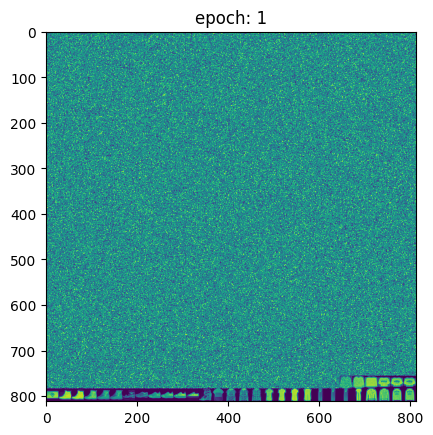

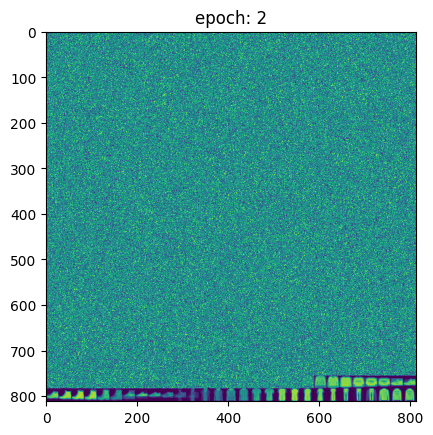

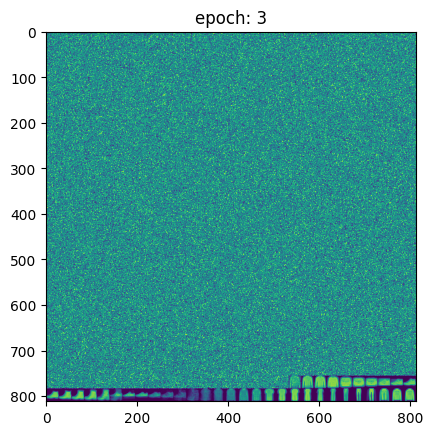

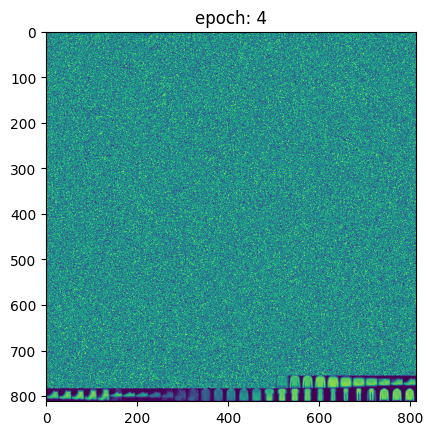

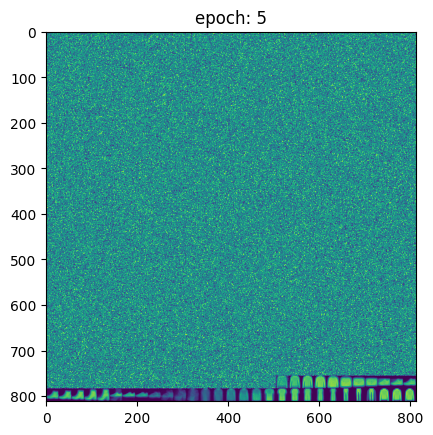

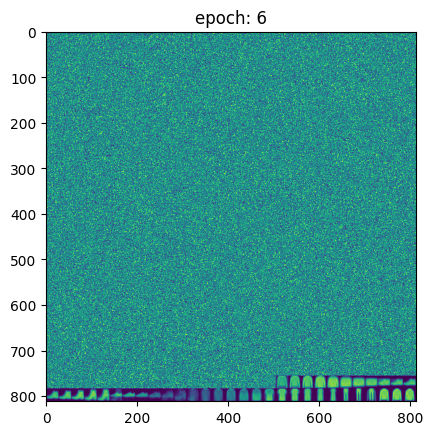

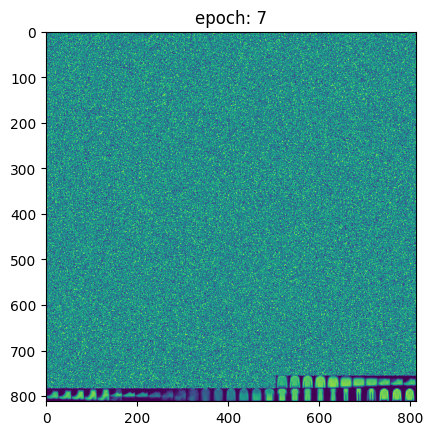

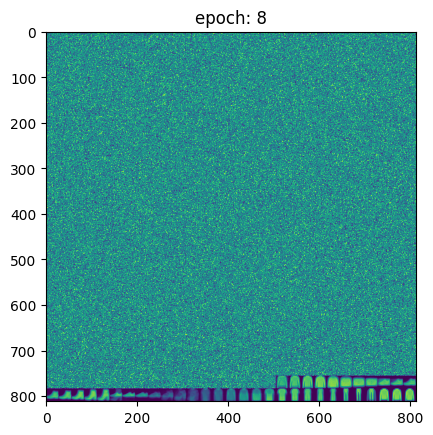

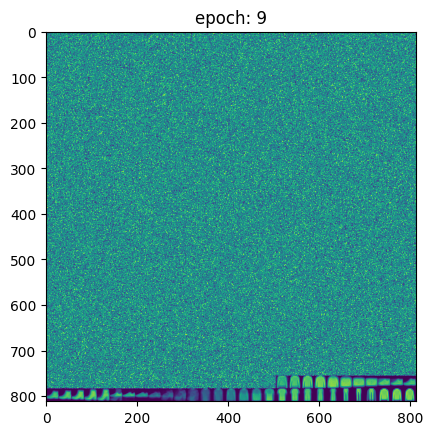

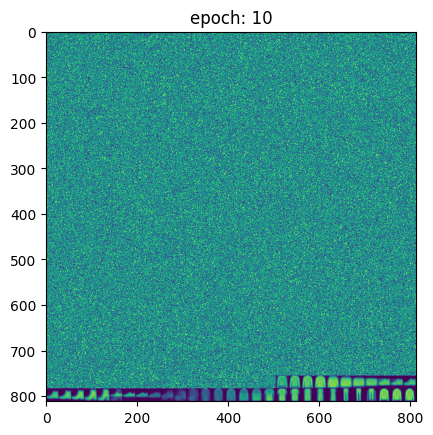

[[0.6 0.6 0.  ... 0.6 0.8 0.1]
 [0.6 1.  0.3 ... 1.  0.5 0.7]
 [0.6 0.2 0.9 ... 0.4 0.1 0.7]
 ...
 [0.  0.  0.  ... 0.  0.  0. ]
 [0.  0.  0.  ... 0.  0.  0. ]
 [0.  0.  0.  ... 0.  0.  0. ]]
(841, 784)
Table for class discrimination by neurons
Cluster: 804, classes: [82. 99. 87. 94. 71.  2. 79.  0. 11. 14.]
Cluster: 806, classes: [  0.   0.   0.   0.   0.  71.   0. 104.  44.  64.]
Cluster: 805, classes: [ 2.  0.  3.  0.  0. 28.  7.  1. 41. 40.]
Cluster: 838, classes: [ 0.  0. 19.  0. 12.  0.  7.  0.  0.  0.]
Cluster: 840, classes: [0. 0. 1. 0. 9. 0. 0. 0. 0. 0.]
Cluster: 807, classes: [0. 0. 0. 0. 0. 5. 0. 0. 0. 0.]
Cluster: 839, classes: [0. 0. 1. 0. 2. 0. 0. 0. 0. 0.]

Table for number of class discrimination by neurons
Cluster: 804, classes: 539
Cluster: 806, classes: 283
Cluster: 805, classes: 122
Cluster: 838, classes: 38
Cluster: 840, classes: 10
Cluster: 807, classes: 5
Cluster: 839, classes: 3

Total images of top 10 neurons are: 1000

[804, 806, 805, 838, 840, 807, 839]
Clust

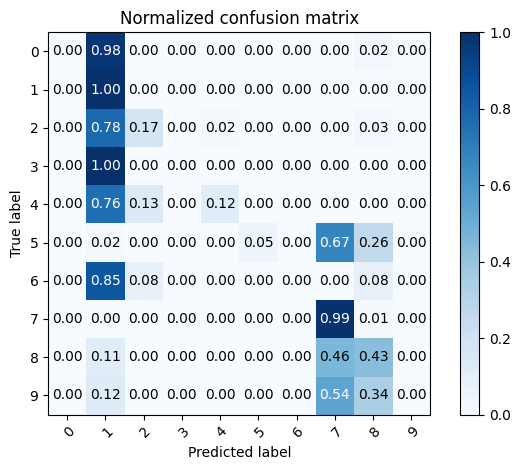

<Figure size 50000x60000 with 0 Axes>

In [4]:
import numpy as np
import pandas as pd


def gen_adjacent_node(arr, node=(0)):
    rows = len(arr)
    for r in [-1, 0, 1]:
        if r == 0:
            continue
            # check valid index
        if 0 <= node + r < rows:
            yield [node + r]


def node_giver(arr, given_num1):
    # given_num = 29
    dimension1 = (arr.shape[0])
    x_axis = given_num1
    final_list1 = []
    a = gen_adjacent_node(arr, node=x_axis)
    for item in a:
        final_list1.append(item)
    new_list1 = []
    for item in final_list1:
        value_x1 = item[0]
        new_list1.append(value_x1)
    return new_list1


def top_neurons(labels_predicted1, top):
    labels_predicted1 = np.array(labels_predicted1, dtype=int)
    neuron_dict1 = {}
    for i in range(len(labels_predicted1)):
        if labels_predicted1[i] in neuron_dict1.keys():
            neuron_dict1[labels_predicted1[i]] += 1
        else:
            neuron_dict1[labels_predicted1[i]] = 1
    neuron_list1 = sorted(neuron_dict1, key=neuron_dict1.get, reverse=True)[:top]
    return neuron_list1, neuron_dict1

def my_img_show(w1, epoch1):
    img1 = w1.reshape(841, 28, 28)
    # print(img1)
    # print('2')
    img1 = img1.reshape(29, 29, 28, 28)
    # print(img1)
    img1 = img1.transpose((0, 2, 1, 3)).reshape(812, 812)
    plt.imshow(img1, cmap='viridis')
    plt.title('epoch: {}'.format(epoch1))
    plt.show()


''' Load data '''
import gzip
import matplotlib.pyplot as plt
import numpy as np

f = gzip.open('/content/gdrive/MyDrive/t10k-images-idx3-ubyte.gz', 'r')

image_size = 28
num_images = 10000

f.read(16)
buf = f.read(image_size * image_size * num_images)
data = np.frombuffer(buf, dtype=np.uint8).astype(np.float32)
data = data.reshape(num_images, image_size, image_size, 1)
print(data.shape)

data = data.reshape(num_images, 784)
data = data / 255.0
image = np.asarray(data[3].reshape(28, 28)).squeeze()

# plt.imshow(image)

data = data.reshape(num_images, 784)
vectors = data

''' Load labels '''
f = gzip.open('/content/gdrive/MyDrive/t10k-labels-idx1-ubyte.gz', 'r')
f.read(8)
labels_true = []
for i in range(0, num_images):
    buf = f.read(1)
    labels = np.frombuffer(buf, dtype=np.uint8).astype(np.int64)[0]
    labels_true.append(labels)
    # print(labels)
labels_true = np.array(labels_true)
# print(labels_true[2])

''' Shuffle data '''
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(data, labels_true, test_size=0.1, random_state=42)

data = X_test
vectors = data
labels_true = y_test

''' Initialize parameters'''

m_cluster = 841
alpha = 0.5
lr = 0.6

''' Initialize weights '''

w = np.random.random([m_cluster, vectors.shape[1]])
w = np.round(w, decimals=3)
print(w)

''' SOM algorithm '''
counter = 0
epoch = 10
for k in range(epoch):
    for i in range(len(vectors)):
        D = np.zeros(len(w))
        for j in range(len(w)):
            D[j] = sum((w[j] - vectors[i]) ** 2)
        J = np.argmin(D)
        '''Update with R = 1'''
        sample_arr = np.ones([((m_cluster))])
        new_list = node_giver(sample_arr, J)
        for item in new_list:
            w[item] = w[item] + lr * (vectors[i] - w[item])
        '''Update itself '''
        w[J] = w[J] + lr * (vectors[i] - w[J])
    if counter <= 150:
        my_img_show(w, k + 1)
    ''' Round w til 3 decimal points '''
    w = np.round(w, decimals=5)
    lr *= alpha
w = np.round(w, decimals=1)
print(w)
print(w.shape)

''' Extract predicted labels '''
clusters_labels = {}
labels_predicted = np.zeros(len(vectors), dtype=int)
for j in range(len(vectors)):
    n_cluster = np.zeros(m_cluster)
    for i in range(len(w)):
        a = vectors[j]
        b = w[i]
        value = np.matmul(a, b)
        n_cluster[i] = value
    labels_predicted[j] = np.argmax(n_cluster)
    if labels_predicted[j] not in clusters_labels.keys():
        sample_list = np.zeros(10)
        sample_list[int(labels_true[j])] += 1
        clusters_labels[int(labels_predicted[j])] = sample_list
    else:
        value = clusters_labels[labels_predicted[j]]
        value1 = labels_true[j]
        sample_list = clusters_labels[labels_predicted[j]]
        sample_list[value1] += 1
        clusters_labels[labels_predicted[j]] = sample_list

labels_predicted = np.array(labels_predicted, dtype=int)
top_number = 10
neuron_list, neuron_dict = top_neurons(labels_predicted, top=top_number)

print('Table for class discrimination by neurons')
for item in neuron_list:
    print('Cluster: {}, classes: {}'.format(item, clusters_labels[item]))
    # print('Classes: ', clusters_labels[item])
print('\nTable for number of class discrimination by neurons')
for item in neuron_list:
    print('Cluster: {}, classes: {}'.format(item, neuron_dict[item]))
counter = 0
for item in neuron_list:
    counter += neuron_dict[item]
print('\nTotal images of top {} neurons are: {}\n'.format(top_number, counter))
print(neuron_list)
# print(neuron_list)
# print(neuron_dict)
# print(clusters_labels)
# print(labels_predicted)
# print(labels_true)

''' Cluster matching '''
print('Cluster matching')
labels_predicted = np.array(labels_predicted, dtype=int)
labels_true = np.array(labels_true, dtype=int)

all_labels = np.unique(labels_predicted)
labels_dict = {}
for j in range(len(all_labels)):
    value = all_labels[j]
    element_indexes_predicted = np.argwhere(labels_predicted == value).T[0]
    element_true = np.zeros(len(element_indexes_predicted))
    for i in range(len(element_indexes_predicted)):
        element_true[i] = labels_true[element_indexes_predicted[i]]
    element_true = np.array(element_true, dtype=int)
    counts = np.bincount(element_true)
    labels_dict[value] = int(np.argmax(counts))

labels_predicted = np.array(labels_predicted, dtype=int)
for i in range(len(labels_predicted)):
    value = labels_predicted[i]
    labels_predicted[i] = labels_dict[value]

''' Calculate confusion matrix '''
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels


def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    # print(len(np.unique(y_true)))
    # print(len(np.unique(y_pred)))
    # classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        # print("Normalized confusion matrix")
    else:
        # print('Confusion matrix, without normalization')
        a = 1

    # print(cm)

    fig, ax = plt.subplots()
    plt.figure(figsize=(500, 600))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


class_names = unique_labels(labels_true, labels_predicted)
print('Here')
print(class_names)

# Plot normalized confusion matrix
plot_confusion_matrix(labels_true, labels_predicted, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

# print(confusion_matrix(labels_true, labels_predicted))


(10000, 28, 28, 1)
[[0.123 0.949 0.019 ... 0.862 0.271 0.642]
 [0.826 0.149 0.274 ... 0.839 0.083 0.743]
 [0.218 0.661 0.551 ... 0.666 0.881 0.091]
 ...
 [0.219 0.709 0.099 ... 0.748 0.996 0.116]
 [0.254 0.995 0.053 ... 0.994 0.079 0.706]
 [0.216 0.382 0.146 ... 0.564 0.365 0.028]]


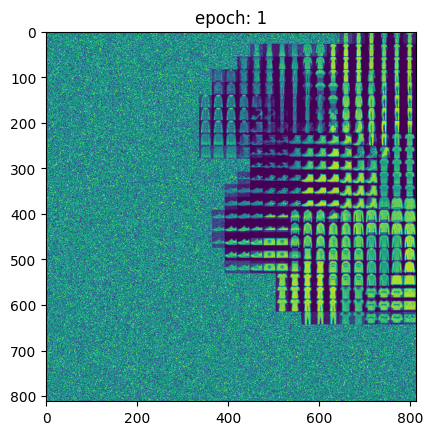

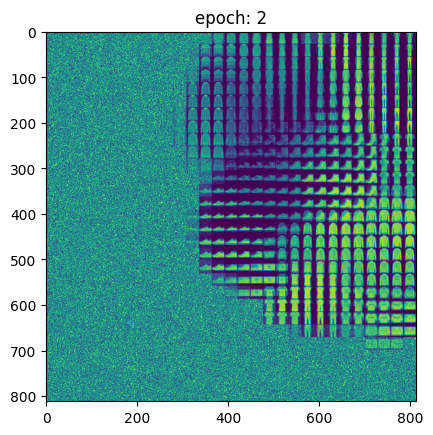

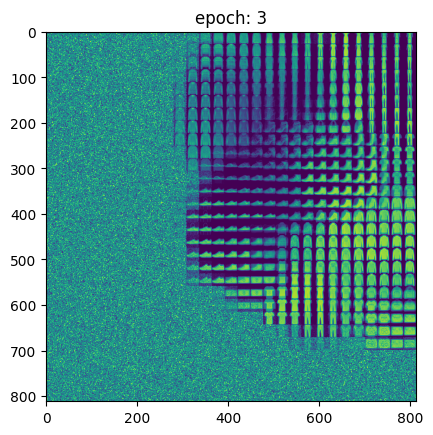

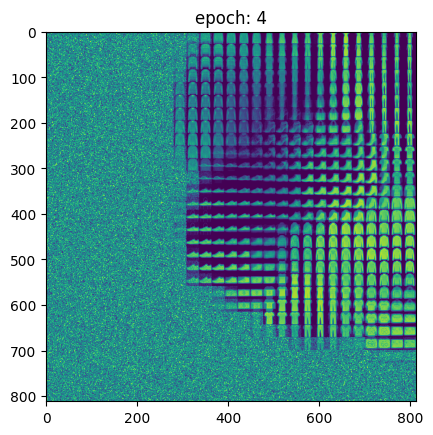

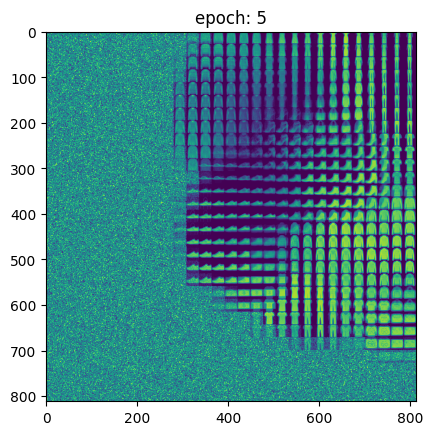

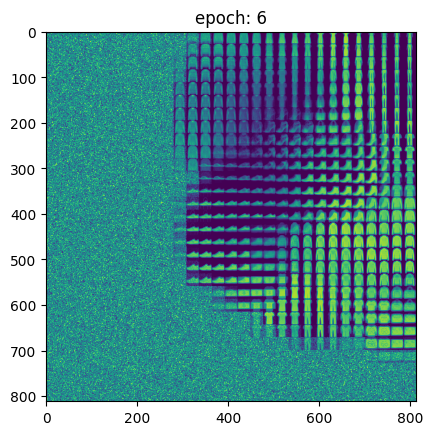

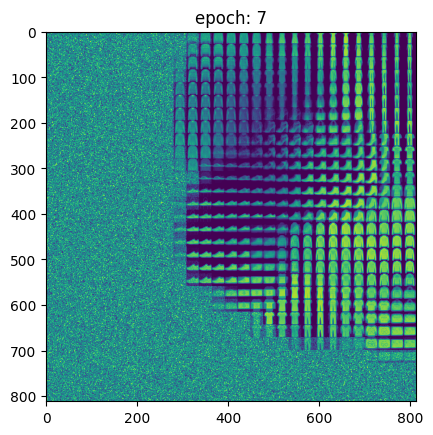

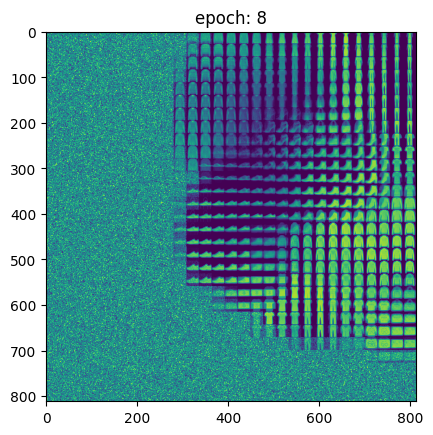

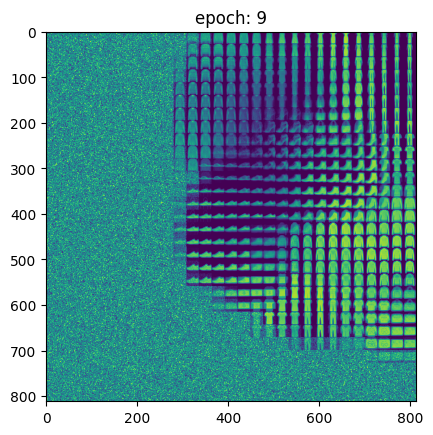

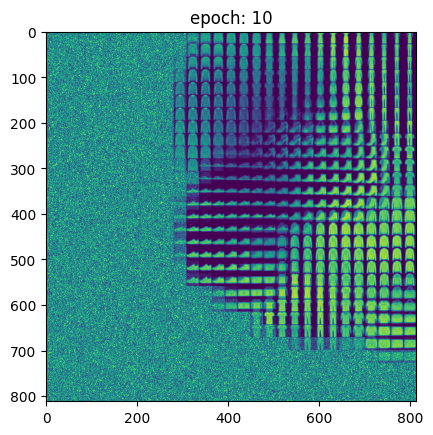

[[0.1 0.9 0.  ... 0.9 0.3 0.6]
 [0.8 0.1 0.3 ... 0.8 0.1 0.7]
 [0.2 0.7 0.6 ... 0.7 0.9 0.1]
 ...
 [0.2 0.7 0.1 ... 0.7 1.  0.1]
 [0.3 1.  0.1 ... 1.  0.1 0.7]
 [0.2 0.4 0.1 ... 0.6 0.4 0. ]]
(841, 784)
Table for class discrimination by neurons
Cluster: 693, classes: [  1.   0.   0.   0.   0.  80.   1. 104.  48.  55.]
Cluster: 405, classes: [ 5.  0. 20.  2.  5. 11. 13.  0. 22. 19.]
Cluster: 458, classes: [ 3.  2. 12. 16. 30.  0. 14.  0. 18.  1.]
Cluster: 630, classes: [ 0. 76.  0.  0.  0.  0.  0.  0.  0.  0.]
Cluster: 519, classes: [ 0.  0. 36.  0. 26.  0. 12.  0.  0.  1.]
Cluster: 488, classes: [ 5.  0. 20.  2. 18.  2. 22.  0.  5.  0.]
Cluster: 655, classes: [53.  3.  0.  6.  0.  0.  9.  0.  0.  1.]
Cluster: 599, classes: [ 9.  6.  0. 38.  3.  0.  9.  0.  2.  0.]
Cluster: 601, classes: [ 3. 10.  0. 17.  0.  0.  1.  0.  0.  0.]
Cluster: 489, classes: [ 0.  1. 16.  0.  7.  0.  5.  0.  0.  0.]

Table for number of class discrimination by neurons
Cluster: 693, classes: 289
Cluster: 405, c

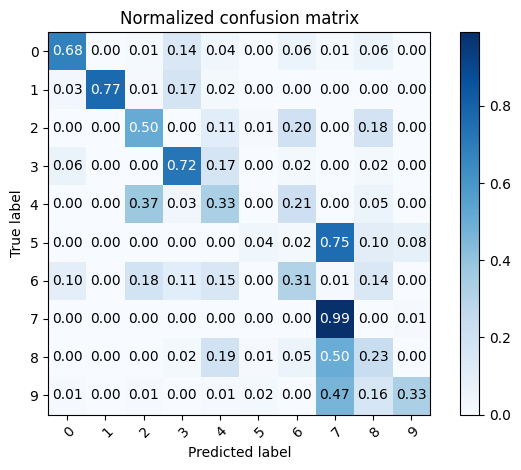

<Figure size 50000x60000 with 0 Axes>

In [5]:
import numpy as np
import pandas as pd


def gen_adjacent_node(matrix_2d, node=(0, 0)):
    rows = len(matrix_2d)
    columns = len(matrix_2d[0])
    for r in [-1, 0, 1]:
        for c in [-1, 0, 1]:
            if r == c == 0:
                continue
            # check valid index
            if 0 <= node[0] + r < rows and 0 <= node[1] + c < columns:
                # print((node[0]+i, node[1]+j))
                yield [node[0] + r, node[1] + c]


def top_neurons(labels_predicted1, top):
    labels_predicted1 = np.array(labels_predicted1, dtype=int)
    neuron_dict1 = {}
    for i in range(len(labels_predicted1)):
        if labels_predicted1[i] in neuron_dict1.keys():
            neuron_dict1[labels_predicted1[i]] += 1
        else:
            neuron_dict1[labels_predicted1[i]] = 1
    neuron_list1 = sorted(neuron_dict1, key=neuron_dict1.get, reverse=True)[:top]
    return neuron_list1, neuron_dict1


def node_giver(arr, given_num1):
    # given_num = 29
    dimension1 = (arr.shape[0]) ** 2
    x_y = int(np.sqrt(dimension1))
    x_axis = given_num1 // x_y
    y_axis = given_num1 % x_y
    # print(x_axis)
    # print(y_axis)
    final_list1 = []
    a = gen_adjacent_node(arr, node=(x_axis, y_axis))
    for item in a:
        final_list1.append(item)
        # print(item)
    new_list1 = []
    for item in final_list1:
        value_x1 = item[0]
        value_y1 = item[1]
        final_value1 = value_x1 * int(np.sqrt(dimension1)) + value_y1
        new_list1.append(final_value1)
    return new_list1


def my_img_show(w1, epoch1):
    img1 = w1.reshape(841, 28, 28)
    # print(img1)
    # print('2')
    img1 = img1.reshape(29, 29, 28, 28)
    # print(img1)
    img1 = img1.transpose((0, 2, 1, 3)).reshape(812, 812)
    plt.imshow(img1, cmap='viridis')
    plt.title('epoch: {}'.format(epoch1))
    plt.show()


''' Load data '''
import gzip
import matplotlib.pyplot as plt
import numpy as np

f = gzip.open('/content/gdrive/MyDrive/t10k-images-idx3-ubyte.gz', 'r')

image_size = 28
num_images = 10000

f.read(16)
buf = f.read(image_size * image_size * num_images)
data = np.frombuffer(buf, dtype=np.uint8).astype(np.float32)
data = data.reshape(num_images, image_size, image_size, 1)
print(data.shape)

data = data.reshape(num_images, 784)
data = data / 255.0
image = np.asarray(data[3].reshape(28, 28)).squeeze()

# plt.imshow(image)

data = data.reshape(num_images, 784)
vectors = data

''' Load labels '''
f = gzip.open('/content/gdrive/MyDrive/t10k-labels-idx1-ubyte.gz', 'r')
f.read(8)
labels_true = []
for i in range(0, num_images):
    buf = f.read(1)
    labels = np.frombuffer(buf, dtype=np.uint8).astype(np.int64)[0]
    labels_true.append(labels)
    # print(labels)
labels_true = np.array(labels_true)
# print(labels_true[2])

''' Shuffle data '''
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(data, labels_true, test_size=0.1, random_state=42)

data = X_test
vectors = data
labels_true = y_test

''' Initialize parameters'''

m_cluster = 841
alpha = 0.5
lr = 0.6

''' Initialize weights '''

w = np.random.random([m_cluster, vectors.shape[1]])
w = np.round(w, decimals=3)
print(w)

''' SOM algorithm '''
counter = 0
epoch = 10
for k in range(epoch):
    for i in range(len(vectors)):
        D = np.zeros(len(w))
        for j in range(len(w)):
            D[j] = sum((w[j] - vectors[i]) ** 2)
        J = np.argmin(D)
        '''Update with R = 1'''
        sample_arr = np.ones([int(np.sqrt(m_cluster)), int(np.sqrt(m_cluster))])
        new_list = node_giver(sample_arr, J)
        for item in new_list:
            w[item] = w[item] + lr * (vectors[i] - w[item])
        '''Update itself '''
        w[J] = w[J] + lr * (vectors[i] - w[J])
    if counter <= 150:
        my_img_show(w, k + 1)
    ''' Round w til 3 decimal points '''
    w = np.round(w, decimals=5)
    lr *= alpha
w = np.round(w, decimals=1)
print(w)
print(w.shape)

''' Extract predicted labels '''
clusters_labels = {}
labels_predicted = np.zeros(len(vectors), dtype=int)
for j in range(len(vectors)):
    n_cluster = np.zeros(m_cluster)
    for i in range(len(w)):
        a = vectors[j]
        b = w[i]
        value = np.matmul(a, b)
        n_cluster[i] = value
    labels_predicted[j] = np.argmax(n_cluster)
    if labels_predicted[j] not in clusters_labels.keys():
        sample_list = np.zeros(10)
        sample_list[int(labels_true[j])] += 1
        clusters_labels[int(labels_predicted[j])] = sample_list
    else:
        value = clusters_labels[labels_predicted[j]]
        value1 = labels_true[j]
        sample_list = clusters_labels[labels_predicted[j]]
        sample_list[value1] += 1
        clusters_labels[labels_predicted[j]] = sample_list

labels_predicted = np.array(labels_predicted, dtype=int)
top_number = 10
neuron_list, neuron_dict = top_neurons(labels_predicted, top=top_number)

print('Table for class discrimination by neurons')
for item in neuron_list:
    print('Cluster: {}, classes: {}'.format(item, clusters_labels[item]))
    # print('Classes: ', clusters_labels[item])
print('\nTable for number of class discrimination by neurons')
for item in neuron_list:
    print('Cluster: {}, classes: {}'.format(item, neuron_dict[item]))
counter = 0
for item in neuron_list:
    counter += neuron_dict[item]
print('\nTotal images of top {} neurons are: {}\n'.format(top_number, counter))
print(neuron_list)
# print(neuron_list)
# print(neuron_dict)
# print(clusters_labels)
# print(labels_predicted)
# print(labels_true)

''' Cluster matching '''
print('Cluster matching')
labels_predicted = np.array(labels_predicted, dtype=int)
labels_true = np.array(labels_true, dtype=int)

all_labels = np.unique(labels_predicted)
labels_dict = {}
for j in range(len(all_labels)):
    value = all_labels[j]
    element_indexes_predicted = np.argwhere(labels_predicted == value).T[0]
    element_true = np.zeros(len(element_indexes_predicted))
    for i in range(len(element_indexes_predicted)):
        element_true[i] = labels_true[element_indexes_predicted[i]]
    element_true = np.array(element_true, dtype=int)
    counts = np.bincount(element_true)
    labels_dict[value] = int(np.argmax(counts))

labels_predicted = np.array(labels_predicted, dtype=int)
for i in range(len(labels_predicted)):
    value = labels_predicted[i]
    labels_predicted[i] = labels_dict[value]

''' Calculate confusion matrix '''
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels


def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    # print(len(np.unique(y_true)))
    # print(len(np.unique(y_pred)))
    # classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        # print("Normalized confusion matrix")
    else:
        # print('Confusion matrix, without normalization')
        a = 1

    # print(cm)

    fig, ax = plt.subplots()
    plt.figure(figsize=(500, 600))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


class_names = unique_labels(labels_true, labels_predicted)
print('Here')
print(class_names)

# Plot normalized confusion matrix
plot_confusion_matrix(labels_true, labels_predicted, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

# print(confusion_matrix(labels_true, labels_predicted))


In [6]:
import numpy as np


def f(input):
    if input >= 0:
        return input
    else:
        return 0


x_old = [1.2, 1.1, 1, 0.9, 0.95, 1.15]
x = [1.2, 1.1, 1, 0.9, 0.95, 1.15]
e = 0.15
x = np.array(x)
x_new = np.zeros(6)
iter = 0
while True:
    for i in range(len(x)):
        sum = 0
        for j in range(len(x)):
            if i != j:
                sum += x[j]
        x_new[i] = f(x[i] - e * sum)
    x = np.copy(x_new)
    non_zero_index = np.nonzero(x)
    for k in range(len(non_zero_index) - 1):
        if np.equal(x[non_zero_index[k]], x[non_zero_index[k + 1]]):
            break
    if (np.count_nonzero(x)) == 1:
        break
    iter += 1
    print("iteration", iter, ": ", x)
print("iteration", iter + 1, ": ", x)
index = np.nonzero(x)
for ind in range(len(index)):
    print("maximum element :", x_old[ind])


iteration 1 :  [0.435  0.32   0.205  0.09   0.1475 0.3775]
iteration 2 :  [0.264    0.13175  0.       0.       0.       0.197875]
iteration 3 :  [0.21455625 0.06246875 0.         0.         0.         0.1385125 ]
iteration 4 :  [0.18440906 0.00950844 0.         0.         0.         0.09695875]
iteration 5 :  [0.16843898 0.         0.         0.         0.         0.06787112]
iteration 6 :  [0.15825832 0.         0.         0.         0.         0.04260528]
iteration 7 :  [0.15186752 0.         0.         0.         0.         0.01886653]
iteration 8 :  [0.14903754 0.         0.         0.         0.         0.        ]
maximum element : 1.2


In [7]:
import numpy as np


def f(input):
    if input >= 0:
        return input
    else:
        return 0


x_old = [1.2, 1.1, 1, 0.9, 0.95, 1.15]
x = [1.2, 1.1, 1, 0.9, 0.95, 1.15]
e = 0.15
x = np.array(x)
x_new = np.zeros(6)
sorted_descending = []  # max to min
while True:
    for i in range(len(x)):
        sum = 0
        for j in range(len(x)):
            if i != j:
                sum += x[j]
        x_new[i] = f(x[i] - e * sum)
        if x_new[i] == 0 and not (x_old[i] in sorted_descending):
            sorted_descending = np.insert(sorted_descending, 0, x_old[i])
    x = np.copy(x_new)
    non_zero_index = np.nonzero(x)
    for k in range(len(non_zero_index) - 1):
        if np.equal(x[non_zero_index[k]], x[non_zero_index[k + 1]]):
            break
    if (np.count_nonzero(x)) == 1:
        break
    # print(x)
temp = 0
index = np.nonzero(x)
for ind in range(len(index)):
    # print(x_old[ind])
    temp = x_old[ind]
sorted_descending = np.insert(sorted_descending, 0, temp)
print(sorted_descending)


[1.2  1.15 1.1  0.95 0.9  1.  ]


In [8]:
import numpy as np


def f(input):
    if input >= 0:
        return input
    else:
        return 0


x_old = [1.2, 1.1, 1, 0.9, 0.95, 1.15]
x = [1.2, 1.1, 1, 0.9, 0.95, 1.15]
e = 0.15
x = np.array(x)
x_new = np.zeros(6)
sorted_ascending = []  # min to max
while True:
    for i in range(len(x)):
        sum = 0
        for j in range(len(x)):
            if i != j:
                sum += x[j]
        x_new[i] = f(x[i] - e * sum)
        if x_new[i] == 0 and not (x_old[i] in sorted_ascending):
            sorted_ascending = np.append(sorted_ascending, x_old[i])
    x = np.copy(x_new)
    non_zero_index = np.nonzero(x)
    for k in range(len(non_zero_index) - 1):
        if np.equal(x[non_zero_index[k]], x[non_zero_index[k + 1]]):
            break
    if (np.count_nonzero(x)) == 1:
        break
    # print(x)
temp = 0
index = np.nonzero(x)
for ind in range(len(index)):
    # print(x_old[ind])
    sorted_ascending = np.append(sorted_ascending, x_old[ind])
    temp = x_old[ind]
print(sorted_ascending)



[1.   0.9  0.95 1.1  1.15 1.2 ]


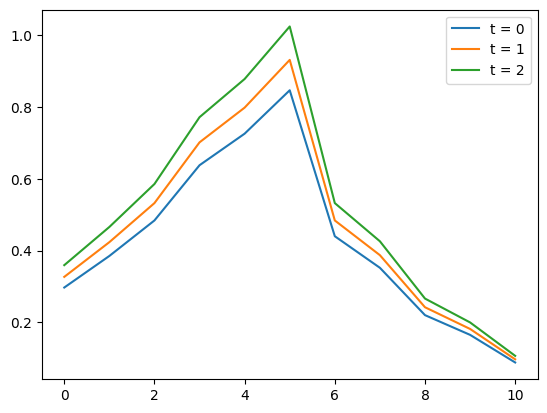

In [9]:
import numpy as np
import matplotlib.pyplot as plt


def f(input):
    if input < 0:
        return 0
    elif 0 <= input < 2:
        return input
    else:
        return 2


R1 = 0
R2 = 11
C1 = 1.1
C2 = -2

# R1 = 1
# R2 = 3
# C1 = 0.6
# C2 = -0.4
t = 1
t_max = 4


x_old = np.zeros(11)
x = np.zeros(11)
x_new = np.zeros(11)
s = [0.27, 0.35, 0.44, 0.58, 0.66, 0.77, 0.4, 0.32, 0.2, 0.15, 0.08]
s = np.array(s)
x = s
x_old = x
x_old_per_iter = np.zeros((t_max - 1, 11))

while t < t_max:
    for i in range(len(x)):
        x1, x2, x3 = 0, 0, 0
        v =0
        for k in range(-R1, R1+1):
            if i + k - R1 < 0 or i + k + R1 > 10:
                x1 += 0
            else:
                x1 += C1 * x_old[i + k]
        for k in range(-R2, -R1 - 1+1):
            if i + k - R2 < 0 or i + k - R1 - 1 > 10:
                x2 += 0
            else:
                x2 += C2 * x_old[i + k]
        for k in range(R1 + 1, R2+1):
            if i + k - R1 - 1 < 0 or i + k + R2 > 10:
                x3 += 0
            else:
                x3 += C2 * x_old[i + k]
        x_new[i] = f(x1+x2+x3)

    x_old = x_new
    x_old_per_iter[t - 1] = x_old
    plt.plot(x_old_per_iter[t-1], label='t = {}'.format(t-1))
    t += 1

plt.legend()
plt.show()


In [10]:
import numpy as np

v = np.zeros((10, 6))
v[0] = [1, -1, 1, 1, -1, 1]
v[1] = [-1, 1, 1, -1, 1, -1]
v[2] = [1, 1, 1, -1, -1, -1]
v[3] = [-1, -1, -1, 1, 1, 1]
v[4] = [1, 1, 1, 1, 1, 1]
v[5] = [-1, -1, 1, -1, -1, -1]
v[6] = [-1, -1, -1, 1, -1, -1]
v[7] = [1, 1, -1, -1, 1, 1]
v[8] = [1, 1, -1, 1, 1, 1]
v[9] = [1, 1, 1, -1, 1, 1]

e = np.zeros((3, 6))
e[0] = [1, -1, 1, -1, 1, -1]
e[1] = [-1, 1, -1, 1, -1, 1]
e[2] = [1, 1, 1, 1, 1, 1]

w = [e[0], e[1], e[2]]
w = 0.5 * np.array(w)
w = w.T
b = 3

y_in = np.zeros(len(e))
out = np.zeros(len(v))

for i in range(len(v)):
    for j in range(len(e)):
        y_in[j] = b + np.sum(v[i] * w[:, j])
    out[i] = np.argmax(y_in)

print(out)


[2. 0. 0. 1. 2. 0. 1. 2. 2. 2.]
